<a id='f_6'></a>
#  Рынок заведений общественного питания Москвы

Оценены критерии, которые влияют на успешность запуска ресторана. Определены вид заведения, количество посадочных мест, а также район расположения. Полученные данные визуализированы. На основе данных выбрано место для открытия новой кофейни.

Исследование проведено в 4 этапа:


 1. [Предобработка данных](#f_1)
 2. [Анализ и описание данных](#f_2)
 3. [Анализ и описание данных категории "Кофейни"](#f_3) 
 4. [Подготовка презентации.](#f_4) 

<a id='f_1'></a>
## Предобработка данных

[К оглавлению](#f_6)

### Изучение общей информации

Импортируем библиотеки для проведения анализа и сохраним файл в переменную `data`.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go

import folium
from folium import Map, Choropleth # импортируем карту и хороплет
import json# подключаем модуль для работы с JSON-форматом

import warnings
warnings.filterwarnings('ignore')# отключим всплывающие предупреждения

In [2]:
data = pd.read_csv('moscow_places.csv')

Составим первое представление о данных и возможных ошибках в данных.

In [3]:
def fst_imp(data):
    """This function is giving first impression of data. Also checking exact duplicates and blanks"""
    return (display(data.head(3)),
            print(data.info()), 
            print('---------------------------------------------'),
            display(data.describe()),
            print("Exact duplicates:", data.duplicated().sum()),
            print(" "),
            print("Blanks by columns:"),
            display(pd.DataFrame(round(data.isna().mean()*100,2)).style.background_gradient('coolwarm')))

print(fst_imp(data))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None
---------------------------------------------


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Exact duplicates: 0
 
Blanks by columns:


,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.380000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.560000
avg_bill,54.600000


(None, None, None, None, None, None, None, None)


Итак, мы обнаружили пропуски в столбце "hours", можно предположить что это заведения, работающие круглосуточно 24/7. Чтобы проверить это, посмотрим какие уникальные значения есть в данном столбце.

In [4]:
data['hours'].unique() 

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

Мы убедились, что в датасете не встречается круглосуточных заведений, а значит пропуск в столбце "hours" обозначает, что заведение работает ежедневно и круглосуточно.

Также мы обнаружили пропуски в столбцах "price", "avg_bill" - здесь тип данных object, поэтому мы не сможем заполнить эти пропуски. Столбцы "middle_avg_bill" и "middle_coffee_cup" свзязаны со столбцом "avg_bill", поэтому также не могут быть заполнены. Пропуски в столбце "seats" говорят о том, что в заведении скорее всего нет посадочных мест и они работают навынос. заполним данные пропуски нулями.

In [5]:
data['seats'] = data['seats'].fillna(0) #заменим пропуски в столбце "seats" на 0

data['hours'] = data['hours'].fillna(247) #заменим пропуски в столбце "hours" на 247 (заведение работает 24/7)
data['is_24/7'] = data['hours'] == 247  #создадим новый столбец с булевыми значениями True/False

#создадим функцию категоризации заведений на сетевое/несетевое
def categorize_chain(item):
        if  item == 0:
            return 'несетевое'
        else :
            return 'сетевое'
        
data['chain_cat'] = data['chain'].apply(categorize_chain) #применим заданную функцию        

Далее выделим названия улиц в отдельный столбец. Для начала проведем лемматизацию уникальных значений в столбце "address". Затем создадим функцию, которая будет разделять каждую строку столбца address по символу ',' на части и затем в каждой части выполнять поиск слов, которые мы определили благодаря лемматизации. 

In [6]:
from pymystem3 import Mystem #импортируем библиотеку с функцией лемматизации pymystem3
m = Mystem()
purpose_text = data['address'].unique() #определяем уникальные значения в столбце 'address'
lemmas = m.lemmatize(",".join(purpose_text))#лемматизируем полученные уникальные значения
from collections import Counter

words = ['улица', 'проспект', 'переулок', 'шоссе', 'бульвар', 'площадь', 'тупик', 'аллея','набережная', 'проезд', 'вал' ] 

def extract_street(address):
    for address_part in address.split(','):
        for street_type in words:
            if street_type in address_part:
                return address_part.strip()# удалим лишние пробелы

data['street'] = data['address'].apply(extract_street) 
data.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,chain_cat,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,0.0,False,несетевое,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,несетевое,улица Дыбенко


Итак, данные предварительно изучены и обработаны, теперь можно приступать к анализу.

<a id='f_2'></a>
## Анализ и описание данных

[К оглавлению](#f_6)

Исследуем соотношение видов объектов общественного питания по количеству и построим график при помощи инструмента `graph_objects` библиотеки  plotly.

In [7]:
sum_counts= data['category'].value_counts()

In [8]:
fig = go.Figure(data=[go.Pie(labels=sum_counts.index, values=sum_counts)])

#определяем координаты для расположения названия графика
fig.update_layout(
    title={
        'text': "Соотношение видов объектов общественного питания, %",
        'y':0.9,
        'x':0.4,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

Итак, судя по полученной круговой диаграмме, мы можем определить что превалирующие количество у кафе - 28.3%. Немного меньше количество у ресторанов (24,3%) и замыкают тройку лидеров кофейни с 16,8%.\
Для более наглядного представления распределения категорий, построим столбчатую диаграмму. 

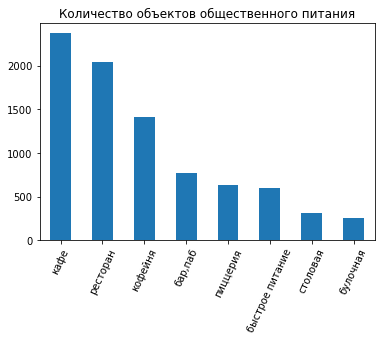

In [9]:
sum_counts.plot(kind='bar', rot=65).set_title('Количество объектов общественного питания');

Далее, исследуем количество посадочных мест в местах по категориям.

Для 50% заведений характерно 20.0 посадочных мест.


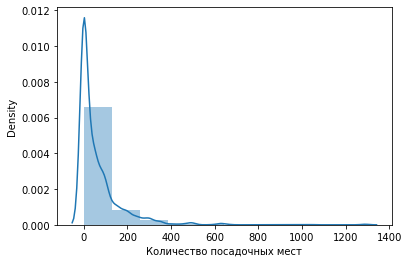

In [10]:
print('Для 50% заведений характерно',data['seats'].median(), 'посадочных мест.')
ax=sns.distplot(data['seats'],bins=10).set(xlabel='Количество посадочных мест'); 

Итак, мы определили, что для заведений в основном характерно около 20 посадочных мест.\
Далее, определим для каждого вида объекта общественного питания среднее количество посадочных мест.

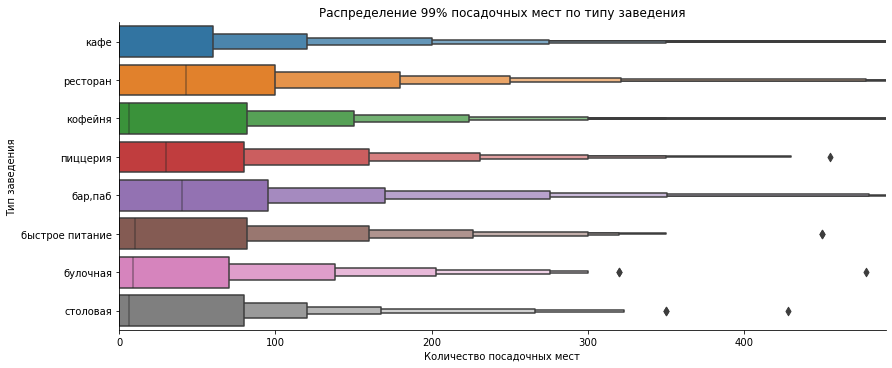

In [11]:
limit_numbers=np.percentile(data['seats'], [99])[0] #получим количество посадочных мест, характерное для 99% заведений 

diamonds = sns.load_dataset("diamonds")
g=sns.catplot(y="category", x="seats", kind="boxen", 
            height=5, aspect=2.5,
            data=data). set(title='Распределение 99% посадочных мест по типу заведения',
                            xlabel='Количество посадочных мест', ylabel='Тип заведения')
g.set(xlim=(0, limit_numbers)); #устанавливаем лимит 


Исходя из полученнного графика, мы определили что наибольшее количество посадочных мест принадлежит ресторанам - около 100 посадочных мест. Чуть меньше посадочных мест у баров. Посмотрим на среднее количество мест в остальных заведениях. 


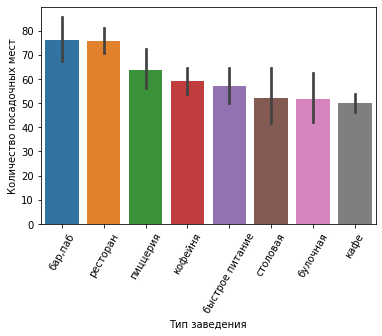

In [12]:
order = data.groupby(["category"])["seats"].mean().sort_values(ascending=False).index
ax= sns.barplot(x='category', y='seats', data=data, order=order)
ax.set(xlabel='Тип заведения', ylabel='Количество посадочных мест')
for item in ax.get_xticklabels(): item.set_rotation(60) #задаем вертикальную подпись оси Х

Итак мы определили, что у ресторанов и баров в среднем около 75 посадочных мест, в пиццериях чуть меньше - 63, в кофейнях и фастфуде в среднем до 60, в столовых, булочных и кафе - около 50.

Исследуем соотношение сетевых и несетевых заведений по количеству.

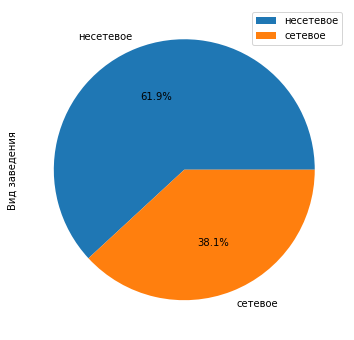

In [13]:
pivot_chain = (data.pivot_table(index = 'chain_cat', values = 'name', aggfunc = 'count')
         .rename(columns = {'name': 'Вид заведения'})
        )

pivot_chain.plot(kind='pie', subplots=True, autopct='%1.1f%%', figsize=(6,6)); 

В данных гораздо больше несетевых заведений. Всего около 3 тыс приходится на сетевые заведения. Но для какого вида объекта общественного питания характерно сетевое распространение? Построим таблицу, а затем визуализируем график.

In [14]:
chain_by_category = data.groupby('category').agg({'chain': 'sum',
                                                 'name': 'count'}).reset_index()
chain_by_category.columns = ['category', 'chain_count', 'total_count']
chain_by_category['% сетевого распространения'] = round(chain_by_category['chain_count']/chain_by_category['total_count']*100,2)
chain_by_category = chain_by_category.sort_values(by='% сетевого распространения', ascending=False)
chain_by_category

,category,chain_count,total_count,% сетевого распространения
1,булочная,157,256,61.33
5,пиццерия,330,633,52.13
4,кофейня,720,1413,50.96
2,быстрое питание,232,603,38.47
6,ресторан,730,2043,35.73
3,кафе,779,2378,32.76
7,столовая,88,315,27.94
0,"бар,паб",169,765,22.09


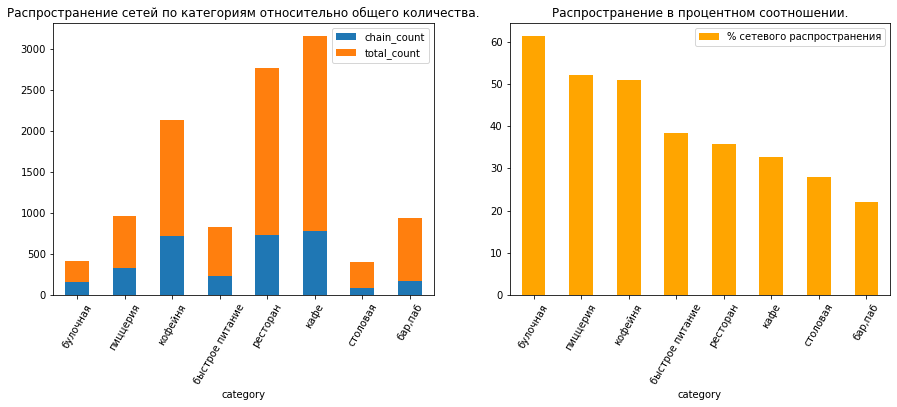

In [15]:
fig, axes = plt.subplots(1,2, figsize=(15,5)) #параметр, располагающий 2 графика в одной плоскости

ax = chain_by_category.plot.bar(x='category', y=['chain_count', 'total_count'], stacked=True, rot=60, ax=axes[0])
axes[0].set_title('Распространение сетей по категориям относительно общего количества.')

chain_by_category.plot.bar(x='category', y='% сетевого распространения', rot=60, color='orange', ax=axes[1])
axes[1].set_title('Распространение в процентном соотношении.');

Таким образом мы выяснили, что сетевое распространение характерно в основном для булочных,пиццерий и кофеен. Создадим отдельный датафрейм с топ-15 популярных сетей в Москве`top_15_chain_rest` для этих заведений и построим график.

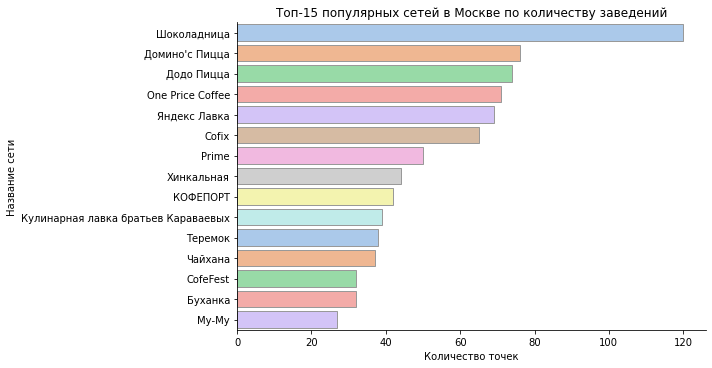

In [16]:
chain_rest = data.query('chain_cat=="сетевое"') #создадим датафрейм только с сетевыми заведениями
top_15_chain_rest = (chain_rest
         .groupby('name')
         .agg({'address':'count'})
         .sort_values(by = 'address', ascending = False)
         .head(15).index
        )

sns.catplot(y="name", kind="count",
            palette="pastel", edgecolor=".6",
            height=5, aspect=2,
            data=data.query('name in @top_15_chain_rest'),order=top_15_chain_rest).set(
    title='Топ-15 популярных сетей в Москве по количеству заведений', xlabel='Количество точек', ylabel='Название сети');

Судя по графику, к самым популярным сетям относятся кофейни, пиццерии и предприятия быстрого обслуживания. \
Построим таблицу с распределением нашего ТОПа по категориям и визуализируем на графике.

In [17]:
top_chain_by_category = (chain_rest.query('name in @top_15_chain_rest')
                         .groupby('category').agg({'name': 'count'})
                         
                         .sort_values(by='name', ascending=False)
                        )
top_chain_by_category=top_chain_by_category.merge(chain_by_category, on='category', how='left')
top_chain_by_category['% сетевого распространения'] = round(top_chain_by_category['name']/top_chain_by_category['total_count']*100,2)
top_chain_by_category = top_chain_by_category.sort_values(by='% сетевого распространения', ascending=False)

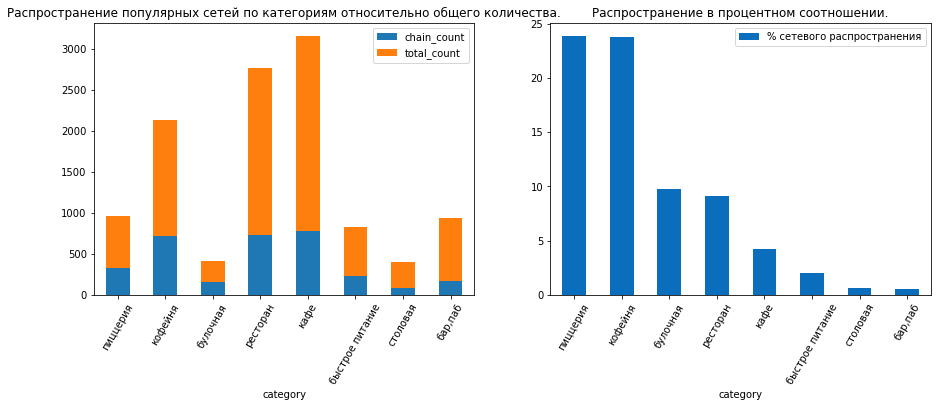

In [18]:
fig, axes = plt.subplots(1,2, figsize=(15,5)) #параметр, располагающий 2 графика в одной плоскости
ax = top_chain_by_category.plot.bar(x='category', y=['chain_count', 'total_count'], stacked=True, rot=60, ax=axes[0])
axes[0].set_title('Распространение популярных сетей по категориям относительно общего количества.')

top_chain_by_category.plot.bar(x='category', y='% сетевого распространения', rot=60, color='#0A6EBD', ax=axes[1]);

axes[1].set_title('Распространение в процентном соотношении.');


Благодаря полученным графикам, мы выявили, что самые успешные и популярные сети среди своих категорий являются пиццерии и кофейни.
Далее, проанализируем данные в разрезе административных районов и построим графики.

In [19]:
# создаем порядок сортировки окргуов по количеству заведений 
order_district = (data
         .groupby('district')
         .agg({'name':'count'})
         .sort_values(by = 'name', ascending = False).index
                 )

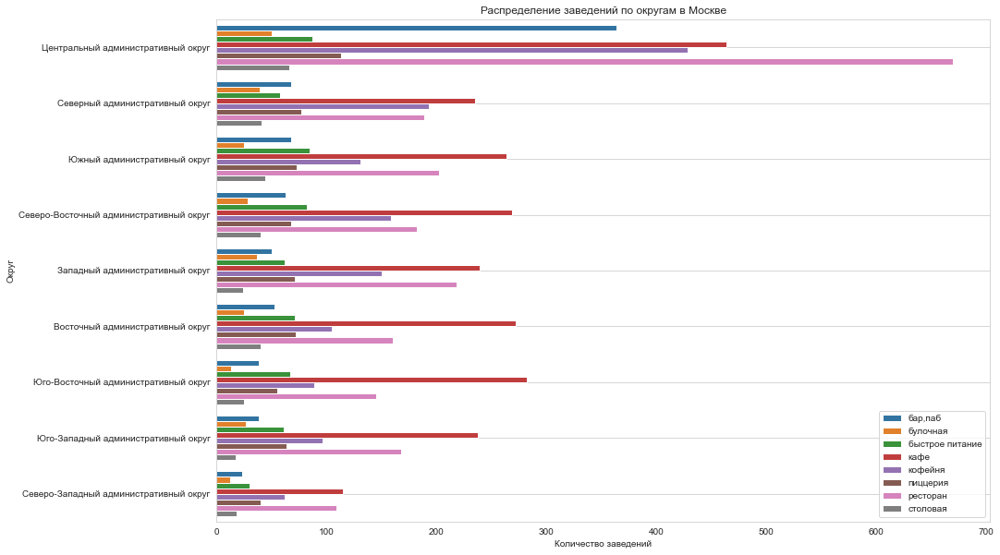

In [20]:
# группируем данные по округу и категории и считаем количество заведений
data_ed = data.groupby(['district', 'category'], \
                        as_index = False)[['name']].count()
# используем стиль whitegrid из библиотеки seaborn
sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(15, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='district', data=data_ed, hue='category', order=order_district)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение заведений по округам в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Округ')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Благодаря полученному графику мы видим, что основная часть заведений находится в ЦАО, из которых превалирующую часть составляют рестораны, кафе, кофейни и бары. А меньше всего заведений в Северо-Западном АО.\
Далее, визуализируем распределение средних рейтингов по категориям заведений. 

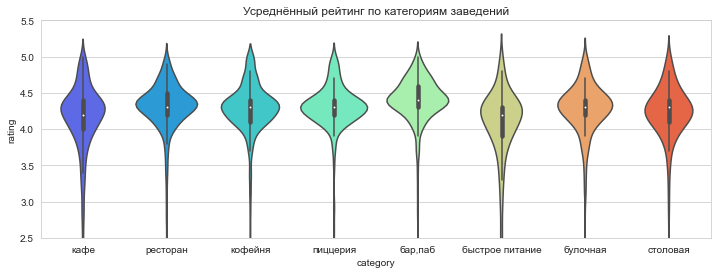

In [21]:
plt.figure(figsize=(12, 4))
sns.violinplot(x="category", y="rating", data=data, palette='rainbow').set(ylim=(2.5, 5.5))
plt.title('Усреднённый рейтинг по категориям заведений');

Судя по полученному графику мы можем определить, что сильных различий в усреднённых рейтингах по категориям нет. Однако стоить выделить бары - средний рейтинг у этой категории заведений выше, чем у какой-либо другой. \
Проверим что с усредненными рейтингами по округам в Москве. Для начала агррегируем данные по району, а затем построим хороплет  со средним рейтингом заведений каждого района.

In [22]:
#агреггируем данные по району и посчитаем средний рейтинг
rating_by_okrug = data.groupby('district', \
                        as_index = False)['rating'].mean()
rating_by_okrug

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239778
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [23]:
# читаем файл и сохраняем в переменной
with open('Moscow_map.geojson', 'r') as f:
    geo_json = json.load(f)

In [24]:
# загружаем JSON-файл с границами округов Москвы 
state_geo = 'Moscow_map.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_by_okrug,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

По построенному хороплету мы видим, что заведения с лучшим рейтингом находятся в Центральном округе Москвы.\
Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [25]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем собственные иконки
from folium.features import CustomIcon

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/?size=512&id=63653&format=png'

    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Далее, найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам.

In [26]:
top_15_streets = (data
         .groupby('street')
         .agg({'address':'count'})
         .sort_values(by = 'address', ascending = False)
         .head(15).index
        )

report = data.query('street in @top_15_streets').pivot_table(index = 'street', 
                                                             columns='category', 
                                                             values = 'name', 
                                                             aggfunc = 'count', ).sort_values(by='ресторан', ascending=True)
display(report)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Алтуфьевское шоссе,5.0,1.0,5.0,13.0,9.0,3.0,10.0,1.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
улица Вавилова,2.0,2.0,11.0,15.0,10.0,3.0,12.0,NaN
улица Миклухо-Маклая,3.0,NaN,4.0,21.0,4.0,2.0,15.0,NaN
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Пятницкая улица,9.0,3.0,2.0,7.0,6.0,3.0,18.0,NaN
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0


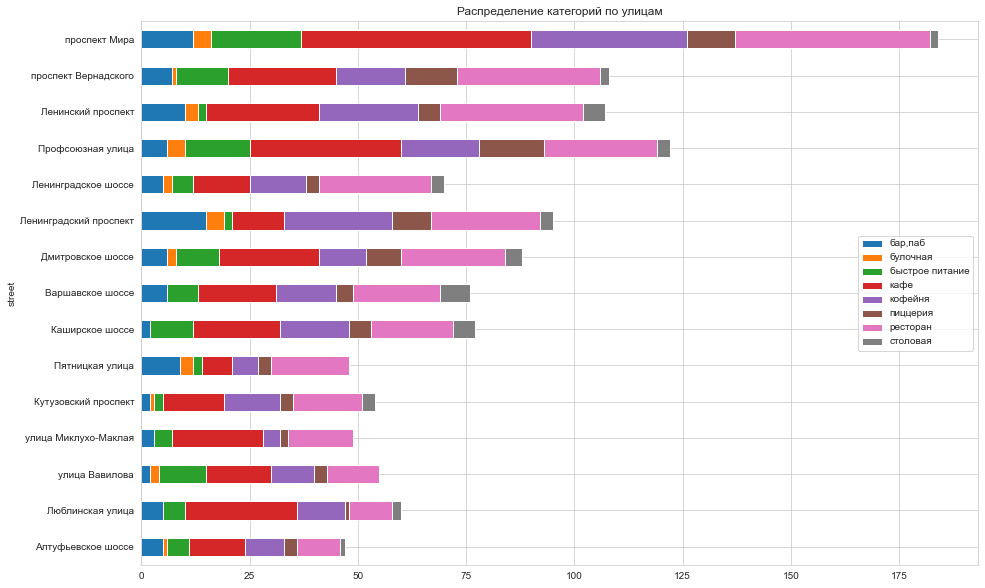

In [27]:
report.plot(kind='barh', stacked=True, figsize=(15,10))
plt.legend(loc='right')
plt.title('Распределение категорий по улицам');

Судя по полученному графику, больше всего заведений находится на Проспекте Мира и основную часть из них составляют кафе и рестораны. В целом распределение категорий заведений по улицам имеет похожую сортировку, за некоторыми исключениями. Так, на Профсоюзной и Люблинской улицах, а также Каширском шоссе большую часть заведений представляют кафе, в то время как на остальных улицах превалируют рестораны. Также больше всего пиццерий и кофеен приходится на Профсоюзную улицу, что объясняется расположением студенческих городков поблизости.

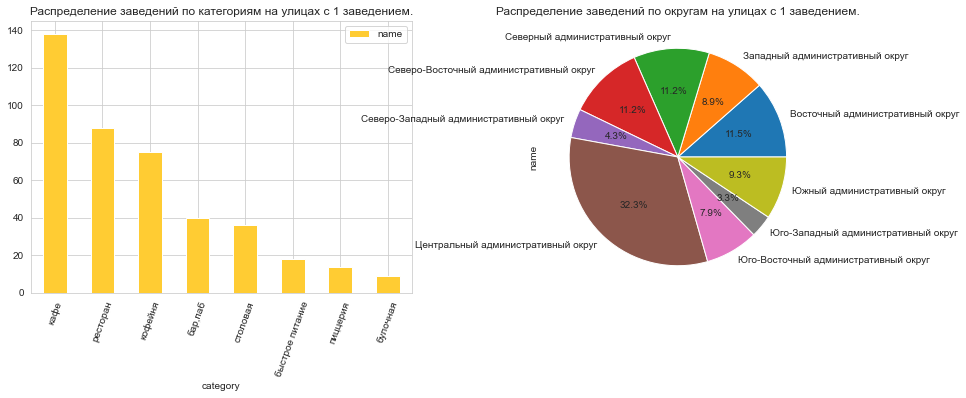

In [28]:
#получим список улиц с одним заведением
single_street = (data
         .groupby('street')
         .agg({'name':'count'}).query('name==1').index
                 )

fig, axes = plt.subplots(1,2, figsize=(15,5)) #параметр, располагающий 2 графика в одной плоскости

myhex = '#FFCC33' #параметр задающий  цвет
(data.query('street in @single_street')
 .groupby('category')
 .agg({'name':'count'})
 .sort_values(by = 'name',ascending = False)
 .plot(kind='bar', rot=70,
       color = myhex, ax=axes[0])
);

axes[0].set_title('Распределение заведений по категориям на улицах с 1 заведением.')

(data.query('street in @single_street')
 .pivot_table(index = 'district', 
              values = 'name',
              aggfunc = 'count')
 .plot(kind='pie', subplots=True, legend=False, autopct='%1.1f%%', ax=axes[1])
);
axes[1].set_title('Распределение заведений по округам на улицах с 1 заведением.');

Благодаря полученным графикам мы выяснили, что улицы с одним заведением имеют те же тенденции что и остальные улицы: превалирующее число заведений - кафе и рестораны, находящиееся в ЦАО. Это можно объяснить тем, что в Центральном округе очень много небольших улочек, на которых можно разместить лишь 1 заведение.

Далее, посчитаем среднюю стоимость счета заведений в каждом округе и построим хороплет.

In [29]:
#агреггируем данные по району и посчитаем средний рейтинг
avg_bill_by_okrug = data.groupby('district', \
                        as_index = False)['middle_avg_bill'].median()
avg_bill_by_okrug.sort_values(by='middle_avg_bill')

,district,middle_avg_bill
6,Юго-Восточный административный округ,450.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
0,Восточный административный округ,575.0
7,Юго-Западный административный округ,600.0
2,Северный административный округ,650.0
4,Северо-Западный административный округ,700.0
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0


In [30]:
# загружаем JSON-файл с границами округов Москвы 
state_geo = 'Moscow_map.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_by_okrug,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средний счет заведений по районам',
).add_to(m)

# выводим карту
m

На хороплете выше мы видим, что самые дорогие заведения находятся в центральном и западных округах Москвы, что объясняется расположением элитных районов в этой части Москвы. Однако, на хороплете с рейтингами мы увидели, что заведения с высокими рейтингами находятся в центральной части Москвы, что значит стоиомсть среднего счета вряд ли имеет особое влияние на рейтинг заведения. Убедимся в этом, построив график типа `.jointplot`. 

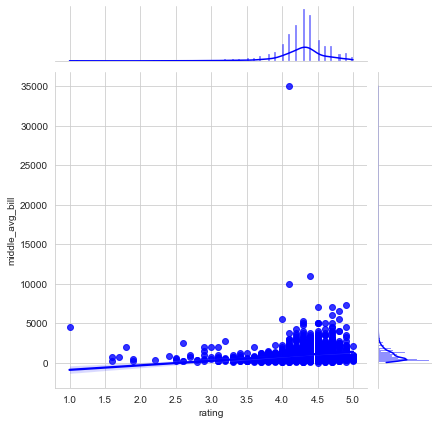

In [31]:
sns.jointplot(x="rating", y="middle_avg_bill",kind='reg', color='blue', data=data);

Таким образом, мы убедились что взаимосвязь между средним счетом и рейтингом достаточно слабая.

### Вывод

Мы получили данные с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. С помощью предобработки данных мы смогли обработать полученный датасет, провести исследовательский анализ данных и построить информативные графики. Это помогло нам выявить параметры, которые влияют на популярность того или иного заведения.\
Мы определили, что основную часть заведений в датасете составляют кафе и рестораны, где около 20 посадочных мест. При этом, для большей части заведений характерно несетевое распространение, за исключением пиццерий, кофейн и булочных. Самым популярным сетевым заведением является Шоколадница. Мы также выявили, что заведения в среднем имеют рейтинг 4.3, но заведения с более высоким рейтингом находятся в Центральном Административном Округе, ровно также, как и самые дорогие. Однако, по дороговизне среднего счета ЦАО не уступает и Западный Административный округ. При этом, мы выяснили, что рейтинг имеет слабую корреляцию со средним счетом заведения. Помимо этого, мы определили улицы с самым высоким распространением общественных заведений - Проспект Мира и Профсоюзную улицы, на которых основную часть занимают кафе, рестораны, пиццерии и кофейни. Далее, рассмотрим и проанализируем именно кофейни и определим какие параметры влияют на успешность данных заведений.

<a id='f_3'></a>
## Кофейни: Анализ и описание данных.

[К оглавлению](#f_6)

Создадим отдельный датасет с кофейнями и выясним, сколько всего таких заведений.

In [32]:
coffee_df = data.query('category== "кофейня"')
print("Кофеен в датасете",coffee_df.shape[0])

Кофеен в датасете 1413


Итак, у нас всего 1413 кофеен, посмотрим как они распределяются по административным округам и какую долю из них составляют сетевые и несетевые заведения.

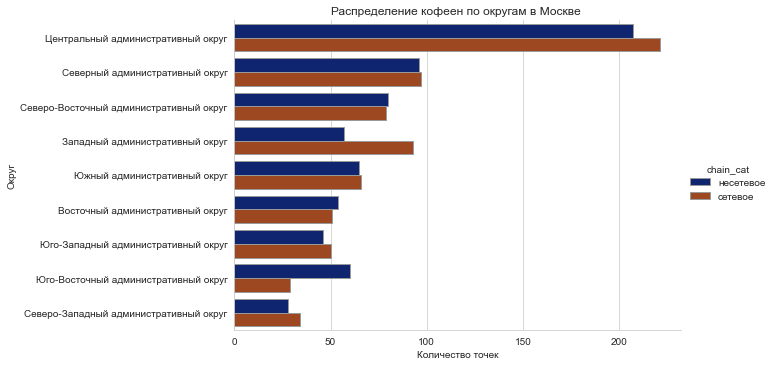

In [33]:
#определим порядок по убыванию количества заведений 
coffe_order_district = (coffee_df
         .groupby('district')
         .agg({'name':'count'})
         .sort_values(by = 'name', ascending = False).index
                 )

sns.catplot(y="district", hue="chain_cat", kind="count",
            palette="dark", edgecolor=".6",
            height=5, aspect=2,
            data=coffee_df,
            order=coffe_order_district).set(title='Распределение кофеен по округам в Москве ', xlabel='Количество точек', ylabel='Округ');

Судя по полученной диаграмме, основная часть кофеен находится в ЦАО, САО и СВАО. При этом, сетевые заведения превалируют над несетевыми практически во всех округах. Однако, в Юго-Восточном округе гораздо больше несетевых кофеен. Посмотрим сколько посадочных мест в среднем приходится на кофейню и каков шанс встретить круглосуточную кофейню в Москве? Для ответов на эти вопросы построим два графика.

В 50% кофеен 6.0 посадочных мест.


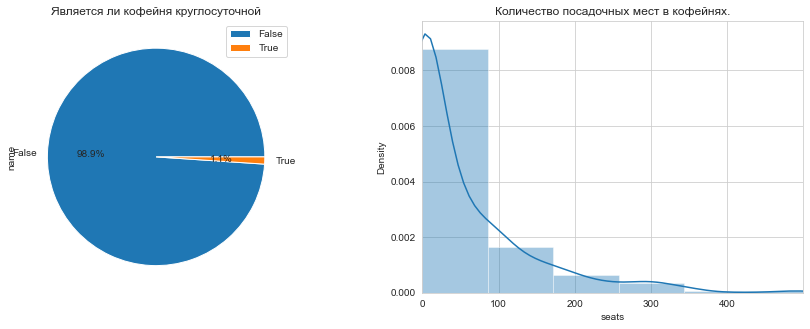

In [34]:
fig, axes = plt.subplots(1,2, figsize=(15,5)) #параметр, располагающий 2 графика в одной плоскости


limit_numbers=np.percentile(coffee_df['seats'], [99])[0] #получим количество посадочных мест, характерное для 99% заведений 

ax=sns.distplot(coffee_df['seats'],bins=15, ax=axes[1]) 
ax.set(xlim=(0, limit_numbers)); #устанавливаем лимит 

axes[1].set_title('Количество посадочных мест в кофейнях.')


(coffee_df
 .pivot_table(index = 'is_24/7', 
              values = 'name',
              aggfunc = 'count')
 .plot(kind='pie', subplots=True, legend=True, autopct='%1.1f%%', ax=axes[0])
);
axes[0].set_title('Является ли кофейня круглосуточной');

print('В 50% кофеен',  coffee_df['seats'].median(), 'посадочных мест.')

Судя по полученной круговой диаграмме мы видим, что только 1,1% приходится на круглосуточные кофейни. Также, мы определили, что в среднем на кофейню приходится менее 100 посадочных мест, однако в 50% случаев в кофейне всего 6 мест, т.к. в основном кофейни работают на вынос и не нуждаются в большем количестве посадочных мест. Интересно рассмотреть распределение посадочных мест по округам.

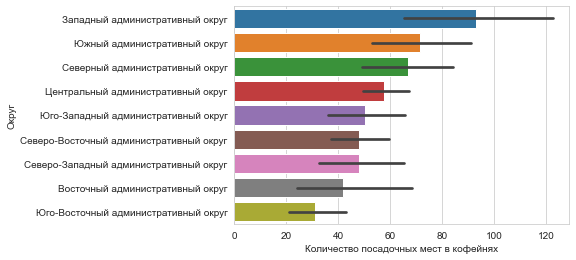

In [35]:
order_c = coffee_df.groupby(["district"])["seats"].mean().sort_values(ascending=False).index
ax= sns.barplot(x='seats', y='district', data=coffee_df, order=order_c)
ax.set(xlabel='Количество посадочных мест в кофейнях', ylabel='Округ');

На графике выше можно заметить, что кофейни с большим количеством посадочных мест находятся на западе, в то время как на юго-востоке преобладают кофейни с минимальным количеством посадочных мест. При этом, ранее мы выяснили что именно на юго-востоке больше частных кофеен, нежели сетевых. Возможно, это объясняется более дешевой арендой помещений для возможности развития малого бизнеса. Далее, посмотрим на распределения рейтингов кофеен по округам.

In [36]:
#агреггируем данные по району и посчитаем средний рейтинг кофеен
avg_rating = coffee_df.groupby('district', \
                        as_index = False)['rating'].mean()
avg_rating

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


Итак, в полученной таблице мы видим, что в среднем во всех округах рейтинг кофеен колеблется на уровне 4,3 балла, кроме Западного. Для наглядности построим хороплет. 

In [37]:
# загружаем JSON-файл с границами округов Москвы 
state_geo = 'Moscow_map.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Проанализируем стоимость чашки капучино по заведениям. Для начала удалим пустые строки в столбце 'middle_coffee_cup' взглянем на данные с помощью метода `.describe()`

In [38]:
coffee_df_bill= coffee_df.dropna(subset=['middle_coffee_cup'])#удалим строки с пустыми значениями в "middle_coffee_cup"
coffee_df_bill['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Итак, мы видим, что датасет распределен равномерно, за исключением выброса в 1568 руб. за чашку капучино. Очистим данные от выбросов.

In [39]:
#удаление выбросов в столбце 'middle_coffee_cup'

# расчет IQR для параметра "coffee_df_bill"
q1 = coffee_df_bill['middle_coffee_cup'].quantile(0.25)#создание 1го квартиля
q3 = coffee_df_bill['middle_coffee_cup'].quantile(0.75)#создание 3го квартиля
iqr = q3 - q1

# границы интервала наиболее вероятных значений
x_min = q1 - 1.5 * iqr
x_max = q3 + 1.5 * iqr

min_lim_qty = len(coffee_df_bill.query('middle_coffee_cup < @x_min')) 
max_lim_qty = len(coffee_df_bill.query('middle_coffee_cup > @x_max'))

dfg = coffee_df_bill.query('@x_min <= middle_coffee_cup <= @x_max') #создадим очищенный датафрейм

print('Количество выбросов -', min_lim_qty+max_lim_qty)
print('Отфильтрованных значений', dfg.shape[0])
print('Доля удаленных данных {:.1%}'.format(coffee_df_bill.shape[0]/dfg.shape[0]-1))

Количество выбросов - 1
Отфильтрованных значений 520
Доля удаленных данных 0.2%


Мы избавились от выбросов, теперь можем построить график, который поможет нам понять на какую стоимость чашки капучино стоит ориентироваться при открытии заведения

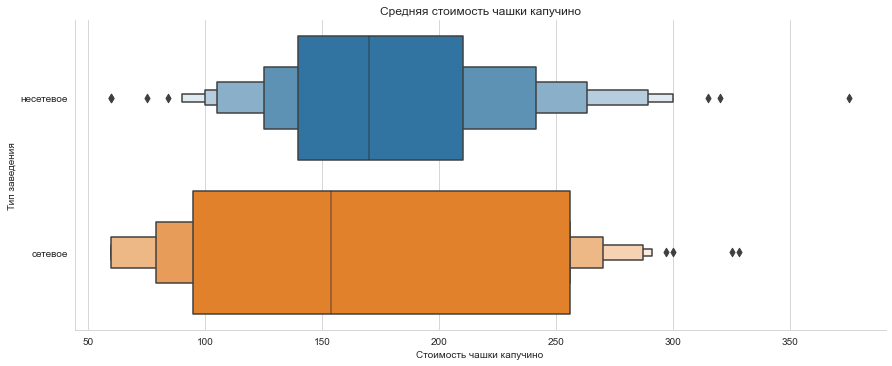

In [40]:
sns.catplot(y="chain_cat", x="middle_coffee_cup", kind="boxen", 
            height=5, aspect=2.5,
            data=dfg). set(title='Средняя стоимость чашки капучино',
                            xlabel='Стоимость чашки капучино', ylabel='Тип заведения');

Итак, мы видим, что основная цена чашки капучино в несетевом заведении около 170 руб, в то время как в сетевом около 155 руб за чашку. На первый взгляд можно предположить что для успешной продажи чашки капучино цена не должна превышать 155 руб., чтобы оставаться конкурентоспособным как с сетевыми, так и с несетевыми заведениями. Однако, коррелирует ли рейтинг заведения со стоимостью чашки капучино? Построим график.

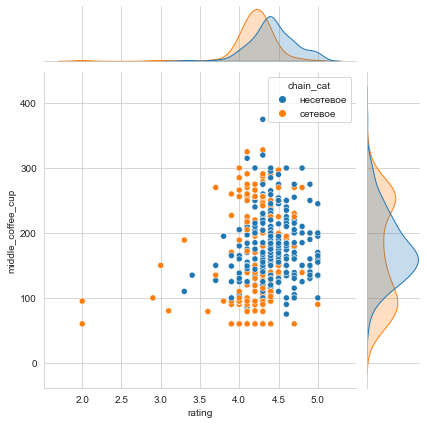

In [41]:
sns.jointplot(x="rating", y="middle_coffee_cup", hue= 'chain_cat', data=dfg);

Итак, судя по полученному графику, стоимость чашки капучино не имеет значительного влияния на рейтинг кофейни,. Это значит, что даже если в новой кофейне цена чашки капучино составит 155 руб., то скорее всего, лояльные клиенты сетевых кофеен все равно предпочтут сеть, нежели авторскую кофейню. Поэтому, для чтобы открыть авторскую кофейню и быть конкурентоспособным, цена не должна составлять не более 175 руб за чашку капучино, что явялется средней ценой для несетевых кофеен.\
Построим хороплет, чтобы определиться с ценовыми сегмантами кофееен по районам.

In [42]:
avg_bill_by_okrug = dfg.groupby('district', \
                        as_index = False)['middle_coffee_cup'].median()

# загружаем JSON-файл с границами округов Москвы 
state_geo = 'Moscow_map.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_by_okrug,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино заведений по районам',
).add_to(m)

# выводим карту
m

Судя по хорплету мы можем увидеть, что в отличие от среднего чека всех заведений, средняя стоимость чашки капучино находится на высоком уровне не только в ЦАО и ЗАО, но и в Юго-Западном административном округе.

### Вывод

Мы провели дополнительный анализ данных по типу заведения "Кофейня", построили графики и определили параметры влияющие на рейтинг заведения.\
Мы выяснили, что основное распределение кофеен приходится на центральную и северную часть Москвы, в то время как основную часть составляют сетевые кофейни. Круглосуточных кофеен в Москве практически нет, при этом чаще всего кофейни работают на вынос, поэтому не имеют большое количество посадочных мест. Также, мы определили, что рейтинг кофеен по районам не различается, при этом цена не влияет на рейтинг заведения. В дополнении, мы обнаружили, что самые дорогие кофейни находятся в Центральном, Западном и Юго-западном округах, в то время как самые дешевые кофейни находятся в Восточном административном округе.\
Отдельное внимание хотелось бы уделить Юго-Западному округу. Мы обнаружили, что в данном округе превалируют кофейни с высоким ценником, при этом конкуренция среди несетевых заведений не такая высокая как в соседнем округе на Юго-Востоке. Помимо этого, район богат на количество студенческих городков и университетов, что является весомым показателем для высокого спроса на кофе.  

<a id='f_4'></a>
## Презентация

Ссылка на презентацию https://disk.yandex.ru/i/lcSjR0G4phmpjA

[К оглавлению](#f_6)